In [1]:
import common_options as co
import matplotlib.cm as cm
import networkx as nx
import numpy as np
import osmnx as ox
import pandas as pd
%matplotlib inline
ox.config(log_console=True, use_cache=True)
ox.__version__

'1.1.0'

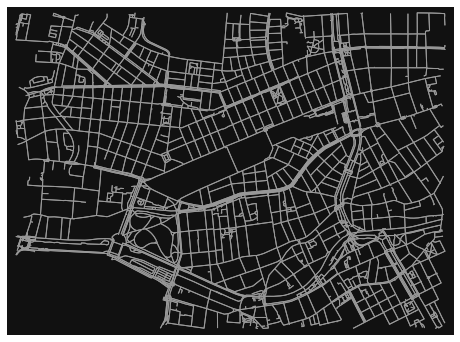

(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

In [2]:
G = ox.graph_from_bbox(*co.bb_westbahnhofareal, simplify=False, clean_periphery=True, custom_filter=co.walking_filter_wbh + '["vehicle"!~"private"]', **co.graph_download_options)

# Remove nodes, to get rid of Schönbrunn bias
G.remove_node(293169342)
G.remove_node(293169872)
#G.remove_node(1873251264)
G.remove_node(1873010838)
G = ox.utils_graph.get_largest_component(G)
G = ox.simplification.simplify_graph(G)
ox.plot_graph(G, node_size=0)

In [3]:
nodes_proj, edges_proj = ox.graph_to_gdfs(G, nodes=True, edges=True)
area = ox.project_gdf(edges_proj).unary_union.convex_hull.area
area

8257996.4630726995

In [4]:
# calculate basic and extended network stats, merge them together, and display
stats = ox.basic_stats(G, area=area)
extended_stats = ox.extended_stats(G, ecc=False, bc=True, cc=False)
for key, value in extended_stats.items():
    stats[key] = value
pd.Series(stats)

/home/lukas/venvs/osmnx/lib/python3.8/site-packages/osmnx/stats.py:405: UserWarning: The extended_stats function has been deprecated and will be removed in a future release. Use NetworkX directly for extended topological measures.
  warnings.warn(msg)


n                                                                                   3075
m                                                                                   9244
k_avg                                                                            6.01236
edge_length_total                                                                 416268
edge_length_avg                                                                  45.0311
streets_per_node_avg                                                              3.0387
streets_per_node_counts                {0: 0, 1: 420, 2: 63, 3: 1617, 4: 930, 5: 43, ...
streets_per_node_proportions           {0: 0.0, 1: 0.13658536585365855, 2: 0.02048780...
intersection_count                                                                  2655
street_length_total                                                               208134
street_segment_count                                                                4622
street_length_avg    

In [5]:
# unpack dicts into individiual keys:values
stats = ox.basic_stats(G, area=area)
for k, count in stats['streets_per_node_counts'].items():
    stats['int_{}_count'.format(k)] = count
for k, proportion in stats['streets_per_node_proportions'].items():
    stats['int_{}_prop'.format(k)] = proportion

# delete the no longer needed dict elements
del stats['streets_per_node_counts']
del stats['streets_per_node_proportions']

# load as a pandas dataframe
pd.DataFrame(pd.Series(stats)).T

,n,m,k_avg,edge_length_total,edge_length_avg,streets_per_node_avg,intersection_count,street_length_total,street_segment_count,street_length_avg,...,int_4_count,int_5_count,int_6_count,int_0_prop,int_1_prop,int_2_prop,int_3_prop,int_4_prop,int_5_prop,int_6_prop
0,3075.0,9244.0,6.012358,416267.79,45.031133,3.038699,2655.0,208133.895,4622.0,45.031133,...,930.0,43.0,2.0,0.0,0.136585,0.020488,0.525854,0.302439,0.013984,0.00065


In [6]:
G_projected = ox.project_graph(G)
max_node, max_bc = max(extended_stats['betweenness_centrality'].items(), key=lambda x: x[1])
max_node, max_bc

(395262, 0.167733968975701)

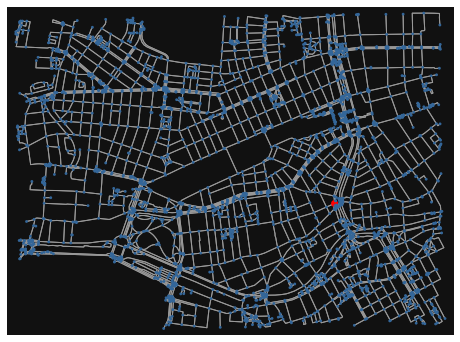

In [7]:
nc = ['r' if node==max_node else '#336699' for node in G_projected.nodes()]
ns = [50 if node==max_node else 8 for node in G_projected.nodes()]
fig, ax = ox.plot_graph(G_projected, node_size=ns, node_color=nc, node_zorder=2)

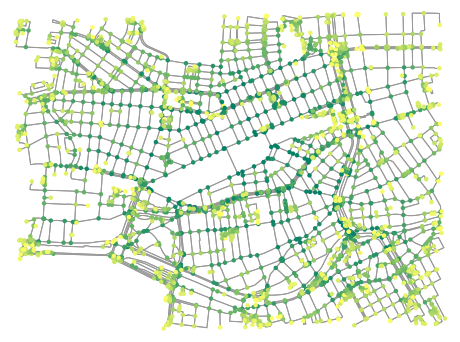

In [8]:
# get a color for each node
def get_color_list(n, color_map='summer_r', start=0, end=1):
    return [cm.get_cmap(color_map)(x) for x in np.linspace(start, end, n)]

def get_node_colors_by_stat(G, data, start=0, end=1):
    df = pd.DataFrame(data=pd.Series(data).sort_values(), columns=['value'])
    df['colors'] = get_color_list(len(df), start=start, end=end)
    df = df.reindex(G.nodes())
    return df['colors'].tolist()

nc = get_node_colors_by_stat(G_projected, data=extended_stats['betweenness_centrality'])
fig, ax = ox.plot_graph(G_projected, node_color=nc, bgcolor='white', node_size=20, node_zorder=2)

In [9]:
line_extended_stats = ox.extended_stats(nx.line_graph(G), ecc=False, bc=True, cc=False)

/home/lukas/venvs/osmnx/lib/python3.8/site-packages/osmnx/stats.py:405: UserWarning: The extended_stats function has been deprecated and will be removed in a future release. Use NetworkX directly for extended topological measures.
  warnings.warn(msg)


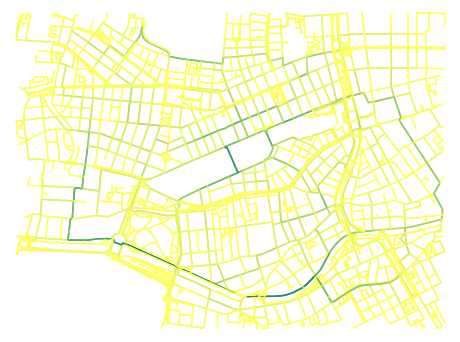

In [10]:
import matplotlib.colors as colors

# list of edge values for the orginal graph
ev = [line_extended_stats['betweenness_centrality'][edge + (0,)] for edge in G.edges()]

# color scale converted to list of colors for graph edges
norm = colors.Normalize(vmin=min(ev)*0.8, vmax=max(ev))
cmap = cm.ScalarMappable(norm=norm, cmap=cm.summer_r)
ec = [cmap.to_rgba(cl) for cl in ev]

# color the edges in the original graph with closeness centralities in the line graph
fig, ax = ox.plot_graph(G, bgcolor='white', node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=ec, edge_linewidth=1.5, edge_alpha=1)

fig.savefig('figures/centrality_betweenness.svg')
fig.savefig('figures/centrality_betweenness.png', bbox_inches='tight')

In [11]:
G_dir = nx.DiGraph(G_projected)

edge_centrality = nx.betweenness_centrality(nx.line_graph(G_dir), weight='length')

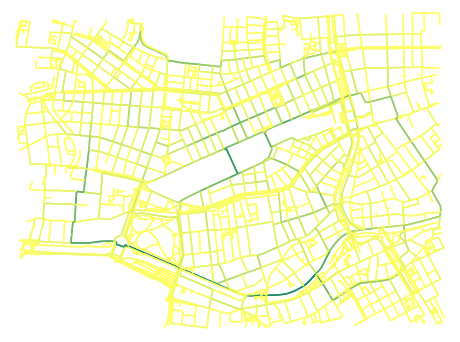

In [12]:
import matplotlib.cm as cm
import matplotlib.colors as colors

# list of edge values for the orginal graph
ev = [edge_centrality[edge] for edge in G_projected.edges()]

# color scale converted to list of colors for graph edges
norm = colors.Normalize(vmin=min(ev)*0.8, vmax=max(ev))
cmap = cm.ScalarMappable(norm=norm, cmap=cm.summer_r)
ec = [cmap.to_rgba(cl) for cl in ev]

# color the edges in the original graph with closeness centralities in the line graph
fig, ax = ox.plot_graph(G_projected, node_size=0, node_color='w', bgcolor='white', node_edgecolor='gray', node_zorder=2,
                        edge_color=ec, edge_linewidth=1.5, edge_alpha=1)